In [1]:
import japanize_matplotlib
import pickle
import random
import statistics

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from pprint import pprint
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error
from scipy.optimize import linprog
from tqdm.auto import tqdm

plt.rcParams["font.family"] = "IPAexGothic"

In [2]:
# データの読み込み
df_result = pd.read_csv("human0821.csv")
df_gt = pd.read_csv("all_data.csv", index_col=0)
df_t = df_gt.T
selected_ids = list(set(df_result["target_ID"]))
df_drop = df_gt.drop(selected_ids, axis=0)

# NMFのweightの読み込み
matrix_dict = {}

for dim in tqdm(range(5, 30)):
    matrix_dict[dim] = [
        np.load(f"nmf_w/drop_selected/nmf_w_r{i}/nmf_w_{dim}_r{i}.npy") for i in range(1000)
    ]

  0%|          | 0/25 [00:00<?, ?it/s]

In [3]:
# LassoでL1ノルム最小解を求める
lasso_samples = []

for index, row in tqdm(df_result.iterrows()):
    data = {}
    data["name"] = row["name"]
    data["target_id"] = row["target_ID"]
    data["clicked_count"] = row["clicked_count"]
    data["clicked_images"] = sorted([int(x) for x in row["clicked_images"].split(",")])
    q_gt = df_gt.iloc[data["target_id"]].to_numpy()
    b = df_gt.iloc[data["target_id"], data["clicked_images"]].to_numpy()

    target_row = df_gt[df_gt.index==data["target_id"]]
    correct_answers = []

    MAE = {}
    qs = {}
    Answers = {}
    q_Answers = {}
    MAE_10_pred = {}

    for n in tqdm(range(5, 30)):

        q_array = []
        for random_state in range(1000):
            W = matrix_dict[n][random_state]
            # A・h_est = b
            A = W[data["clicked_images"]]
            # L1ノルム最小解を求める
            lasso = Lasso(alpha=0.01, max_iter=10**7)
            lasso.fit(A, b)
            q = np.dot(W, lasso.coef_)
            q_array.append(q)
        q = sum(q_array) / len(q_array)
        MAE[n] = mean_absolute_error(q_gt, q)
        q[q < 0] = 0
        q[q > 10] = 10
        qs[n] = q

        answers = []
        q_answers = []
        target_row = df_gt[df_gt.index==data["target_id"]]
        correct_answers = []
        for i in range(10):
            image_id = row[f"ID_of_image{i}"]
            answer = row[f"score_of_image{i}"]
            answers.append(answer)
            q_answers.append(q[image_id])
            correct = target_row[f"No.{image_id+1}の画像があなたの好みであるかを0から10で評価してください．"]
            correct_answers.append(correct)
        Answers[n] = answers
        q_Answers[n] = q_answers
        MAE_10_pred[n] = mean_absolute_error(q_answers, correct_answers)

    data["MAE"] = MAE
    data["q"] = qs
    data["answers"] = Answers
    data["q_answers"] = q_Answers
    data["MAE_10_human"] = mean_absolute_error(answers, correct_answers)
    data["MAE_10_pred"] = MAE_10_pred
    lasso_samples.append(data)

pprint(lasso_samples[0]["q"])

0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
MAE_10_human = []

for i, sample in enumerate(lasso_samples):
    MAE_10_human.append(sample["MAE_10_human"])

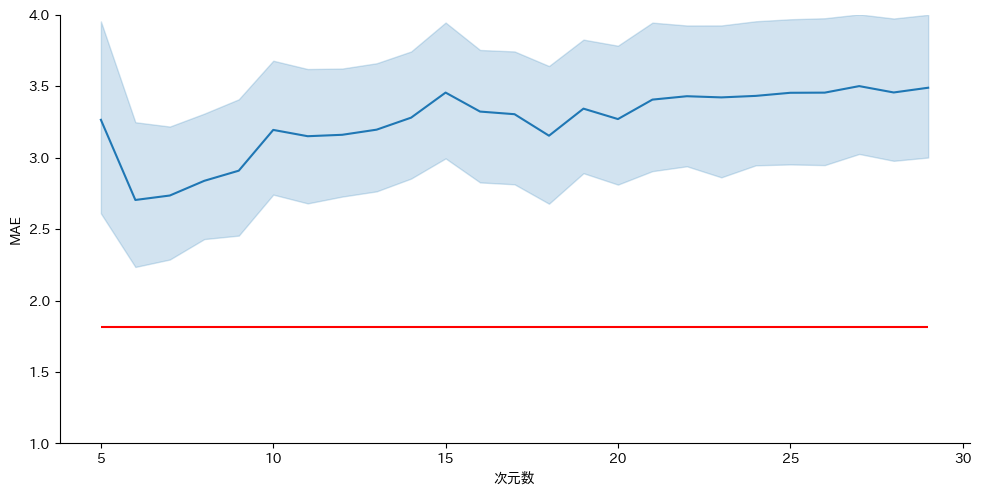

In [ ]:
MAE_pred_all = [[] for _ in range(5, 30)]
dim_MAE = []

for sample in lasso_samples:
    for i in range(5, 30):
        MAE_pred_all[i-5].append(sample["MAE_10_pred"][i])
        dim_MAE.append([i, sample["MAE_10_pred"][i]])

df_dim_MAE = pd.DataFrame(dim_MAE, columns=["dim", "MAE"])

x = list(range(5, 30))
MAE_pred_mean_all = [statistics.mean(mae) for mae in MAE_pred_all]

plt.rcParams["figure.figsize"] = (8, 4)
sns.relplot(data=df_dim_MAE, x="dim", y="MAE", kind='line', aspect=2)
plt.hlines(statistics.mean(MAE_10_human), 5, 29, color="red")
plt.ylim(1,4)
# グラフにタイトルと軸ラベルを追加
plt.xlabel('次元数')
plt.ylabel('MAE')


# グラフを表示
plt.show()

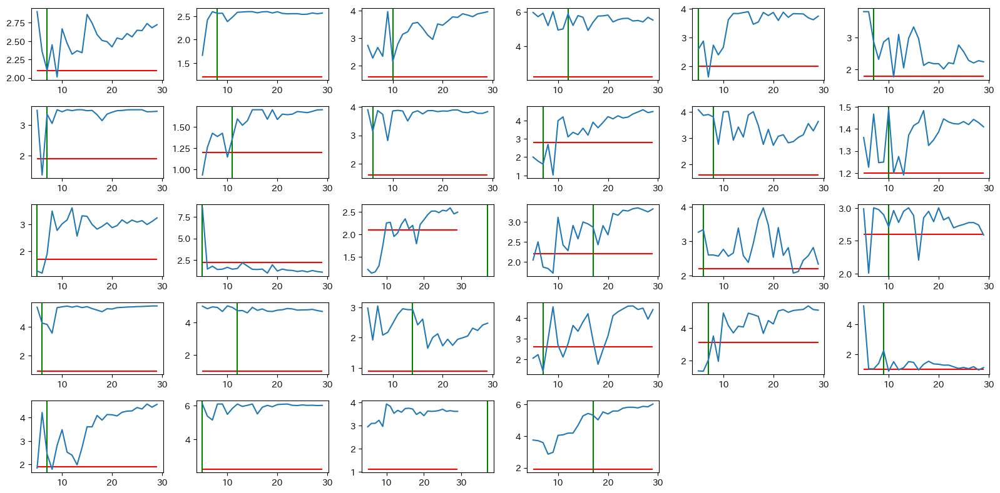

In [64]:
x = list(range(5, 30))

plt.rcParams["figure.figsize"] = (16, 8)
for index, sample in enumerate(lasso_samples):
    plt.subplot(5, 6, index+1)
    plt.hlines(sample["MAE_10_human"], 5, 29, color="red")
    plt.axvline(sample["clicked_count"], color="green")
    sns.lineplot(x=x, y=list(sample["MAE_10_pred"].values()))

plt.tight_layout()

In [48]:
# LassoでL1ノルム最小解を求める
lasso_alpha_result = {}
for alpha in tqdm((0.001, 0.01, 0.1)):
    result = []
    for index, row in tqdm(df_result.iterrows()):
        data = {}
        data["name"] = row["name"]
        data["target_id"] = row["target_ID"]
        data["clicked_count"] = row["clicked_count"]
        data["clicked_images"] = sorted([int(x) for x in row["clicked_images"].split(",")])
        q_gt = df_gt.iloc[data["target_id"]].to_numpy()
        b = df_gt.iloc[data["target_id"], data["clicked_images"]].to_numpy()

        target_row = df_gt[df_gt.index==data["target_id"]]
        correct_answers = []

        MAE = {}
        qs = {}
        Answers = {}
        q_Answers = {}
        MAE_10_pred = {}
        nonzero = {}

        for n in (5, 15, 25):

            q_array = []
            nonzero_array = []
            for random_state in range(1000):
                W = matrix_dict[n][random_state]
                # A・h_est = b
                A = W[data["clicked_images"]]
                # L1ノルム最小解を求める
                lasso = Lasso(alpha=alpha, max_iter=1000000)
                lasso.fit(A, b)
                q = np.dot(W, lasso.coef_)
                nonzero_array.append(np.count_nonzero(lasso.coef_))
                q_array.append(q)
            q = sum(q_array) / len(q_array)
            MAE[n] = mean_absolute_error(q_gt, q)
            qs[n] = q
            nonzero[n] = nonzero_array

            answers = []
            q_answers = []
            target_row = df_gt[df_gt.index==data["target_id"]]
            correct_answers = []
            for i in range(10):
                image_id = row[f"ID_of_image{i}"]
                answer = row[f"score_of_image{i}"]
                answers.append(answer)
                q_answers.append(q[image_id])
                correct = target_row[f"No.{image_id+1}の画像があなたの好みであるかを0から10で評価してください．"]
                correct_answers.append(correct)
            Answers[n] = answers
            q_Answers[n] = q_answers
            MAE_10_pred[n] = mean_absolute_error(q_answers, correct_answers)

        data["MAE"] = MAE
        data["q"] = qs
        data["answers"] = Answers
        data["q_answers"] = q_Answers
        data["MAE_10_human"] = mean_absolute_error(answers, correct_answers)
        data["MAE_10_pred"] = MAE_10_pred
        data["nonzero"] = nonzero
        result.append(data)
    lasso_alpha_result[str(alpha)] = result

  0%|          | 0/3 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

In [49]:
lasso_alpha_result["0.001"][0].keys()

dict_keys(['name', 'target_id', 'clicked_count', 'clicked_images', 'MAE', 'q', 'answers', 'q_answers', 'MAE_10_human', 'MAE_10_pred', 'nonzero'])

[7.418054071284079, 4.171855827871896, 4.037295392866553]
[4.560369476896561, 4.335979260120781, 4.129432528645842]
[4.5617295239631055, 4.091656222292787, 4.034046676149423]


Text(0, 0.5, 'MAE')

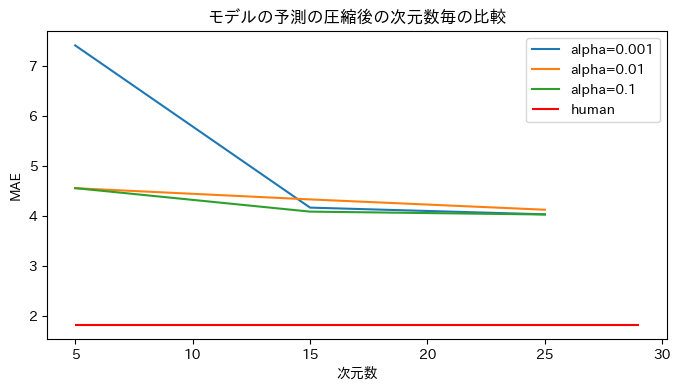

In [50]:
# グラフを描画するためのAxesオブジェクトを作成
plt.figure(figsize=(8, 4))  # グラフのサイズを指定


for index, alpha in enumerate(lasso_alpha_result.keys()):
    MAE_all = {5: [], 15: [], 25: []}

    for sample in lasso_alpha_result[alpha]:
        for i in (5, 15, 25):
            MAE_all[i].append(sample["MAE"][i])

    x = (5, 15, 25)
    MAE_mean_all = [statistics.mean(mae) for mae in MAE_all.values()]
    print(MAE_mean_all)

    sns.lineplot(x=x, y=MAE_mean_all, label=f"alpha={alpha}")

plt.hlines(statistics.mean(MAE_10_human), 5, 29, color="red", label="human")

plt.legend()

# グラフにタイトルと軸ラベルを追加
plt.title('モデルの予測の圧縮後の次元数毎の比較')
plt.xlabel('次元数')
plt.ylabel('MAE')


In [51]:
scat_nonzero = {5: {"alpha": [], "count": []}, 15: {"alpha": [], "count": []}, 25: {"alpha": [], "count": []}}
for alpha in lasso_alpha_result.keys():
    for sample in lasso_alpha_result[alpha]:
        for dim in (5, 15, 25):
            for count in sample["nonzero"][dim]:
                scat_nonzero[dim]["alpha"].append(np.log10(float(alpha)))
                scat_nonzero[dim]["count"].append(count)

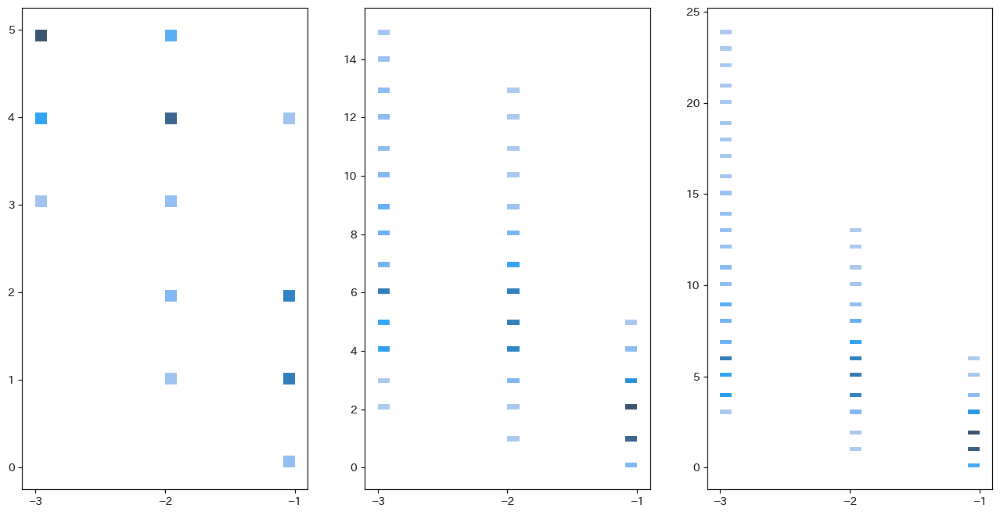

In [52]:
for index, dim in enumerate((5, 15, 25)):
    plt.subplot(1, 3, index+1)
    sns.histplot(x=scat_nonzero[dim]["alpha"], y=scat_nonzero[dim]["count"])
    plt.xticks([-3, -2, -1])

In [53]:
# LassoでL1ノルム最小解を求める
lasso_alpha_result = {}
alpha = 0.01

result = []
for index, row in tqdm(df_result.iterrows()):
    data = {}
    data["name"] = row["name"]
    data["target_id"] = row["target_ID"]
    data["clicked_count"] = row["clicked_count"]
    data["clicked_images"] = sorted([int(x) for x in row["clicked_images"].split(",")])
    q_gt = df_gt.iloc[data["target_id"]].to_numpy()
    b = df_gt.iloc[data["target_id"], data["clicked_images"]].to_numpy()

    target_row = df_gt[df_gt.index==data["target_id"]]
    correct_answers = []

    MAE = {}
    qs = {}
    Answers = {}
    q_Answers = {}
    MAE_10_pred = {}
    nonzero = {}

    for n in tqdm(range(5, 30)):

        q_array = []
        nonzero_array = []
        for random_state in range(1000):
            W = matrix_dict[n][random_state]
            # A・h_est = b
            A = W[data["clicked_images"]]
            # L1ノルム最小解を求める
            lasso = Lasso(alpha=alpha, max_iter=1000000)
            lasso.fit(A, b)
            q = np.dot(W, lasso.coef_)
            nonzero_array.append(np.count_nonzero(lasso.coef_))
            q_array.append(q)
        q = sum(q_array) / len(q_array)
        MAE[n] = mean_absolute_error(q_gt, q)
        qs[n] = q
        nonzero[n] = nonzero_array

        answers = []
        q_answers = []
        target_row = df_gt[df_gt.index==data["target_id"]]
        correct_answers = []
        for i in range(10):
            image_id = row[f"ID_of_image{i}"]
            answer = row[f"score_of_image{i}"]
            answers.append(answer)
            q_answers.append(q[image_id])
            correct = target_row[f"No.{image_id+1}の画像があなたの好みであるかを0から10で評価してください．"]
            correct_answers.append(correct)
        Answers[n] = answers
        q_Answers[n] = q_answers
        MAE_10_pred[n] = mean_absolute_error(q_answers, correct_answers)

    data["MAE"] = MAE
    data["q"] = qs
    data["answers"] = Answers
    data["q_answers"] = q_Answers
    data["MAE_10_human"] = mean_absolute_error(answers, correct_answers)
    data["MAE_10_pred"] = MAE_10_pred
    data["nonzero"] = nonzero
    result.append(data)

0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

In [54]:
result

[{'name': 'matsuzaki',
  'target_id': 461,
  'clicked_count': 7,
  'clicked_images': [1, 4, 9, 10, 49, 70, 87],
  'MAE': {5: 2.8233942573896758,
   6: 2.7983640702067794,
   7: 2.561232944686805,
   8: 2.187367355649831,
   9: 2.443933299588381,
   10: 3.063961798017877,
   11: 3.0549387640983094,
   12: 2.8517564324199163,
   13: 2.5778856319015544,
   14: 2.8150818695842825,
   15: 3.334311870635665,
   16: 2.9502927639171377,
   17: 2.6863161632606887,
   18: 2.500738234389641,
   19: 2.655977852570899,
   20: 2.5834395968073154,
   21: 2.756391924043261,
   22: 2.73510519360704,
   23: 2.638096973848054,
   24: 2.696381842749636,
   25: 2.7166449654934985,
   26: 2.747168079102575,
   27: 2.9434098449275563,
   28: 2.7858438527215434,
   29: 2.945225638994825},
  'q': {5: array([4.19160595, 3.88675152, 4.62895629, 0.52022221, 1.93514217,
          3.94698409, 1.37401819, 1.37960824, 0.53537725, 0.83201105,
          3.93707721, 0.86506337, 3.58155563, 2.25571235, 3.19891387,
      

In [55]:
scat_nonzero = {"dim": [], "count": []}
for sample in result:
    for dim in sample["nonzero"].keys():
        for count in sample["nonzero"][dim]:
            scat_nonzero["dim"].append(dim)
            scat_nonzero["count"].append(count)

<Axes: >

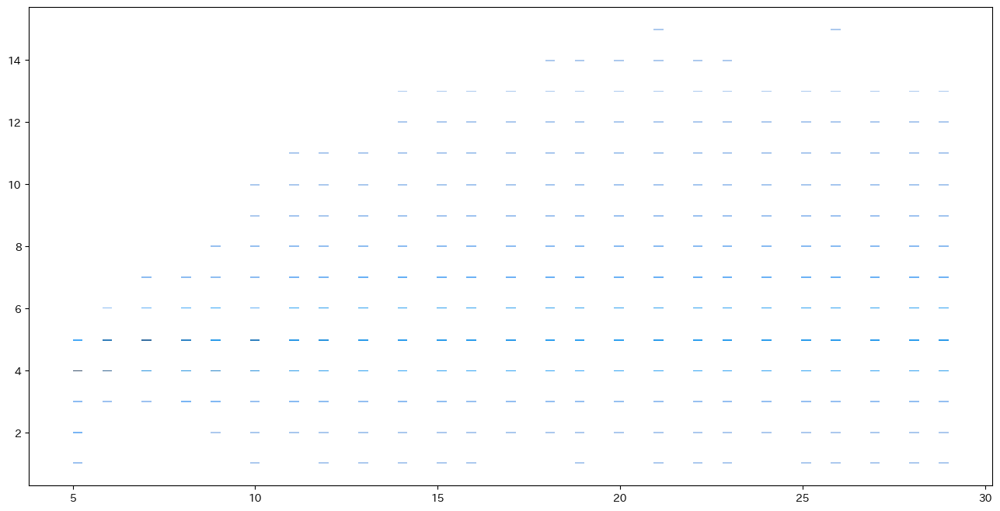

In [56]:
sns.histplot(x=scat_nonzero["dim"], y=scat_nonzero["count"])

In [57]:
progress_result = []
alpha = 0.01

for index, row in tqdm(df_result.iterrows()):
    name = row["name"]
    target_id= row["target_ID"]
    clicked_count = row["clicked_count"]
    clicked_images = [int(x) for x in row["clicked_images"].split(",")]
    q_gt = df_gt.iloc[target_id].to_numpy()

    target_images_id = [row[f"ID_of_image{i}"] for i in range(10)]
    target_cols = [f"No.{id+1}の画像があなたの好みであるかを0から10で評価してください．"  for id in target_images_id]
    correct_answers = df_gt.loc[target_id, target_cols].to_numpy().T

    MAE = {}
    MAE_selected = {}
    for n in tqdm(range(5, 30)):
        image_set = set(range(100))
        MAE[n] = {}
        MAE_selected[n] = {}
        for end, image_id in tqdm(enumerate(clicked_images)):
            MAE[n][end] = {}
            for index, id in enumerate(image_set):
                if end == 0: continue
                images_add = clicked_images[:end]
                images_add.append(id)
                images_add.sort()
                b = df_gt.iloc[target_id, images_add].to_numpy()

                q_array = []
                for random_state in [random.randint(0, 999) for _ in range(10)]:
                    W = matrix_dict[n][random_state]
                    # A・h_est = b
                    A = W[images_add]
                    # L1ノルム最小解を求める
                    lasso = Lasso(alpha=alpha, max_iter=10**7)
                    lasso.fit(A, b)
                    q = np.dot(W, lasso.coef_)
                    q_array.append(q)
                q_mean = sum(q_array) / len(q_array)
                mae = np.mean(np.abs(correct_answers - q_mean[target_images_id]))
                MAE[n][end][id] = mae
                if id == clicked_images[end]:
                    MAE_selected[n][end] = mae
            image_set.remove(image_id)

    result = {}
    result["MAE"] = MAE
    result["MAE_selected"] = MAE_selected
    result["clicked_images"] = clicked_images
    progress_result.append(result)
    break

0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

0it [00:00, ?it/s]

/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/yuita/.pyenv/versions/3.9.10/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

KeyboardInterrupt: 